<a href="https://colab.research.google.com/github/Unseen-Elder/Exploratory-_data_analysis_US_Accidents/blob/main/main/portfolio_project_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Us Accidents Exploratory Data Analysis.

- Source : Kaggle
- Contains : Information about Accidents
- Can be used : to prevent accidents

In [ ]:
pip install opendatasets --quiet

In [ ]:
pip install squarify --quiet

## Data Download

In [ ]:
# Import Drive API and authenticate.
from google.colab import drive

# Mount my Google Drive to the Colab VM.
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import opendatasets as od
# vipulpr
# fbdd929068458093e2b676d6dfccc23f
download_url = 'https://www.kaggle.com/sobhanmoosavi/us-accidents'

od.download(download_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: vipulpr
Your Kaggle Key: ··········


100%|██████████| 269M/269M [00:02<00:00, 107MB/s] 


In [ ]:
data_filename = './us-accidents/US_Accidents_Dec21_updated.csv'

## Data Prepration and cleaning

In [ ]:
# Import python data analysis libraries
import pandas as pd
import numpy as np

In [ ]:
#loading data
df = pd.read_csv(data_filename) 
df.head(5)

,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,3,2016-02-08 00:37:08,2016-02-08 06:37:08,40.108910,-83.092860,40.112060,-83.031870,3.230,Between Sawmill Rd/Exit 20 and OH-315/Olentang...,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,2,2016-02-08 05:56:20,2016-02-08 11:56:20,39.865420,-84.062800,39.865010,-84.048730,0.747,At OH-4/OH-235/Exit 41 - Accident.,...,False,False,False,False,False,False,Night,Night,Night,Night
2,A-3,2,2016-02-08 06:15:39,2016-02-08 12:15:39,39.102660,-84.524680,39.102090,-84.523960,0.055,At I-71/US-50/Exit 1 - Accident.,...,False,False,False,False,False,False,Night,Night,Night,Day
3,A-4,2,2016-02-08 06:51:45,2016-02-08 12:51:45,41.062130,-81.537840,41.062170,-81.535470,0.123,At Dart Ave/Exit 21 - Accident.,...,False,False,False,False,False,False,Night,Night,Day,Day
4,A-5,3,2016-02-08 07:53:43,2016-02-08 13:53:43,39.172393,-84.492792,39.170476,-84.501798,0.500,At Mitchell Ave/Exit 6 - Accident.,...,False,False,False,False,False,False,Day,Day,Day,Day


In [ ]:
# info about our data
len(df.columns), len(df)

(47, 2845342)

47 columns and 2.845 million rows

In [ ]:
# Checking data type of each column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2845342 entries, 0 to 2845341
Data columns (total 47 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   ID                     object 
 1   Severity               int64  
 2   Start_Time             object 
 3   End_Time               object 
 4   Start_Lat              float64
 5   Start_Lng              float64
 6   End_Lat                float64
 7   End_Lng                float64
 8   Distance(mi)           float64
 9   Description            object 
 10  Number                 float64
 11  Street                 object 
 12  Side                   object 
 13  City                   object 
 14  County                 object 
 15  State                  object 
 16  Zipcode                object 
 17  Country                object 
 18  Timezone               object 
 19  Airport_Code           object 
 20  Weather_Timestamp      object 
 21  Temperature(F)         float64
 22  Wind_Chill(F)     

In [ ]:
df.describe()

,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Number,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
count,2.845342e+06,2.845342e+06,2.845342e+06,2.845342e+06,2.845342e+06,2.845342e+06,1.101431e+06,2.776068e+06,2.375699e+06,2.772250e+06,2.786142e+06,2.774796e+06,2.687398e+06,2.295884e+06
mean,2.137572e+00,3.624520e+01,-9.711463e+01,3.624532e+01,-9.711439e+01,7.026779e-01,8.089408e+03,6.179356e+01,5.965823e+01,6.436545e+01,2.947234e+01,9.099391e+00,7.395044e+00,7.016940e-03
std,4.787216e-01,5.363797e+00,1.831782e+01,5.363873e+00,1.831763e+01,1.560361e+00,1.836009e+04,1.862263e+01,2.116097e+01,2.287457e+01,1.045286e+00,2.717546e+00,5.527454e+00,9.348831e-02
min,1.000000e+00,2.456603e+01,-1.245481e+02,2.456601e+01,-1.245457e+02,0.000000e+00,0.000000e+00,-8.900000e+01,-8.900000e+01,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.000000e+00,3.344517e+01,-1.180331e+02,3.344628e+01,-1.180333e+02,5.200000e-02,1.270000e+03,5.000000e+01,4.600000e+01,4.800000e+01,2.931000e+01,1.000000e+01,3.500000e+00,0.000000e+00
50%,2.000000e+00,3.609861e+01,-9.241808e+01,3.609799e+01,-9.241772e+01,2.440000e-01,4.007000e+03,6.400000e+01,6.300000e+01,6.700000e+01,2.982000e+01,1.000000e+01,7.000000e+00,0.000000e+00
75%,2.000000e+00,4.016024e+01,-8.037243e+01,4.016105e+01,-8.037338e+01,7.640000e-01,9.567000e+03,7.600000e+01,7.600000e+01,8.300000e+01,3.001000e+01,1.000000e+01,1.000000e+01,0.000000e+00
max,4.000000e+00,4.900058e+01,-6.711317e+01,4.907500e+01,-6.710924e+01,1.551860e+02,9.999997e+06,1.960000e+02,1.960000e+02,1.000000e+02,5.890000e+01,1.400000e+02,1.087000e+03,2.400000e+01


In [ ]:
# Dropping the columns we dont need 
df = df.drop(['Number','Airport_Code','Description','Precipitation(in)',
              'Wind_Chill(F)','Wind_Speed(mph)','Wind_Direction','Humidity(%)',
              'Roundabout','Astronomical_Twilight','Civil_Twilight',
              'Nautical_Twilight','Stop','Station','Traffic_Calming',
              'Turning_Loop','Zipcode','Street','Pressure(in)',
              'Weather_Timestamp','Timezone','No_Exit','Give_Way','County','ID',
              'Railway','Country'],axis=1)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2845342 entries, 0 to 2845341
Data columns (total 20 columns):
 #   Column             Dtype  
---  ------             -----  
 0   Severity           int64  
 1   Start_Time         object 
 2   End_Time           object 
 3   Start_Lat          float64
 4   Start_Lng          float64
 5   End_Lat            float64
 6   End_Lng            float64
 7   Distance(mi)       float64
 8   Side               object 
 9   City               object 
 10  State              object 
 11  Temperature(F)     float64
 12  Visibility(mi)     float64
 13  Weather_Condition  object 
 14  Amenity            bool   
 15  Bump               bool   
 16  Crossing           bool   
 17  Junction           bool   
 18  Traffic_Signal     bool   
 19  Sunrise_Sunset     object 
dtypes: bool(5), float64(7), int64(1), object(7)
memory usage: 339.2+ MB


In [ ]:
# changing datatype of columns
df = df.astype({'Side' :'category','Weather_Condition':'category','Sunrise_Sunset' : 'category',
                'State' :'category',})
df['Start_Time'] = pd.to_datetime(df['Start_Time'])
df['End_Time'] = pd.to_datetime(df['End_Time'])

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2845342 entries, 0 to 2845341
Data columns (total 20 columns):
 #   Column             Dtype         
---  ------             -----         
 0   Severity           int64         
 1   Start_Time         datetime64[ns]
 2   End_Time           datetime64[ns]
 3   Start_Lat          float64       
 4   Start_Lng          float64       
 5   End_Lat            float64       
 6   End_Lng            float64       
 7   Distance(mi)       float64       
 8   Side               category      
 9   City               object        
 10  State              category      
 11  Temperature(F)     float64       
 12  Visibility(mi)     float64       
 13  Weather_Condition  category      
 14  Amenity            bool          
 15  Bump               bool          
 16  Crossing           bool          
 17  Junction           bool          
 18  Traffic_Signal     bool          
 19  Sunrise_Sunset     category      
dtypes: bool(5), category(4),

In [ ]:
# are there any duplicates?
dup_ = df[df.duplicated()]
dup_.shape[0],(dup_.shape[0]/df.shape[0])*100

(31881, 1.1204628476998548)

In [ ]:
# lets delete duplicate values
df = df.drop_duplicates()

In [ ]:
dup_ = df[df.duplicated()]
dup_.shape[0],(dup_.shape[0]/df.shape[0])*100

(0, 0.0)

there are no duplicates now

In [ ]:
#lets find missing values
df.isna().sum()

Severity                 0
Start_Time               0
End_Time                 0
Start_Lat                0
Start_Lng                0
End_Lat                  0
End_Lng                  0
Distance(mi)             0
Side                     0
City                   137
State                    0
Temperature(F)       68331
Visibility(mi)       69611
Weather_Condition    69664
Amenity                  0
Bump                     0
Crossing                 0
Junction                 0
Traffic_Signal           0
Sunrise_Sunset        2819
dtype: int64

In [ ]:
#lets sort these values in descending order
df.isna().sum().sort_values(ascending=False)

Weather_Condition    69664
Visibility(mi)       69611
Temperature(F)       68331
Sunrise_Sunset        2819
City                   137
Traffic_Signal           0
Junction                 0
Crossing                 0
Bump                     0
Amenity                  0
Severity                 0
Start_Time               0
Side                     0
Distance(mi)             0
End_Lng                  0
End_Lat                  0
Start_Lng                0
Start_Lat                0
End_Time                 0
State                    0
dtype: int64

In [ ]:
# lets find out percentage of missing values in each column
missing_percentage = (df.isna().sum().sort_values(ascending=False)/len(df))*100
missing_percentage

Weather_Condition    2.476096
Visibility(mi)       2.474212
Temperature(F)       2.428717
Sunrise_Sunset       0.100197
City                 0.004869
Traffic_Signal       0.000000
Junction             0.000000
Crossing             0.000000
Bump                 0.000000
Amenity              0.000000
Severity             0.000000
Start_Time           0.000000
Side                 0.000000
Distance(mi)         0.000000
End_Lng              0.000000
End_Lat              0.000000
Start_Lng            0.000000
Start_Lat            0.000000
End_Time             0.000000
State                0.000000
dtype: float64

<AxesSubplot:>

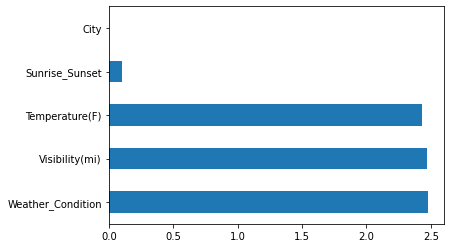

In [ ]:
# Visualising missing values per column
missing_percentage[missing_percentage != 0].plot(kind='barh')

In [ ]:
# since the missing data is very insignificant percentage of total data , 
# we can drop missing data rows. Without any significant data loss

df=df.dropna(); 

In [ ]:
#lets find missing values again
df.isna().sum()

Severity             0
Start_Time           0
End_Time             0
Start_Lat            0
Start_Lng            0
End_Lat              0
End_Lng              0
Distance(mi)         0
Side                 0
City                 0
State                0
Temperature(F)       0
Visibility(mi)       0
Weather_Condition    0
Amenity              0
Bump                 0
Crossing             0
Junction             0
Traffic_Signal       0
Sunrise_Sunset       0
dtype: int64

our data is processed and refined , now we can work on EDA

## Exploratory Analysis and Visualization

In [ ]:
# lets check number of data points we have
len(df)

2723657

In [ ]:
# Some exploratory Data Analysis

list_1=[len(df.Severity.unique()),len(df.Side.unique()),len(df.City.unique()),
len(df.State.unique()),len(df.Weather_Condition.unique()),len(df.Sunrise_Sunset.unique())]
list_1

[4, 2, 10906, 49, 125, 2]

About Data
1. there are 4 types of severity
2. two sides- left or right
3. there are 10906 unique cities
4. there are 49 states
5. 125 different weather conditions
6. day and night as Sunrise_Sunset 

## Asking Questions


### Severity

In [ ]:
# lets find percentage of accidents vs severity
Severity_of_accidents = df['Severity'].value_counts()
Severity_of_accidents

2    2424274
3     149312
4     124535
1      25536
Name: Severity, dtype: int64

In [ ]:
# importing matplotlib
import matplotlib.pyplot as plt

Text(0, 0.5, 'Number of accidents in 100 thousands')

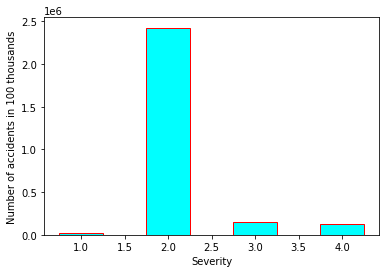

In [ ]:
plt.bar(Severity_of_accidents.index,Severity_of_accidents.iloc[:],width = 0.5
        ,edgecolor=['red'],linewidth=1,color=['cyan'])
plt.xlabel('Severity')
plt.ylabel('Number of accidents in 100 thousands')

we can see most of the accidents were of severity 2

### Amenity

In [ ]:
# lets see if there was amenity nearby when accident happended
Amenity_present=df['Amenity'].value_counts()
(Amenity_present.iloc[1]/len(df))*100

0.9825025691561015

Amenity was present in less than 1 percent of cases.

### Side

In [ ]:
# which side did we observe more accidents
Side=df['Side'].value_counts()
(Side.iloc[0]/len(df))*100

82.6965363112903

Around 82% accidents were because of driving on Right side of the road

### Bump

In [ ]:
# does bump has any relationship with severity of accident?
Severity=[1,2,3,4]
severity_with_bump=[]
for i in range(4):
  severity_with_bump.append((len(df[(df['Severity'] == i+1) & (df['Bump'] == True)])/len(df[df['Severity'] == i+1]))*100)

severity_with_bump

[0.046992481203007516,
 0.03889824335038036,
 0.017413201885983713,
 0.010438832456739069]

Text(0, 0.5, 'Percentage of accidents where bump was present')

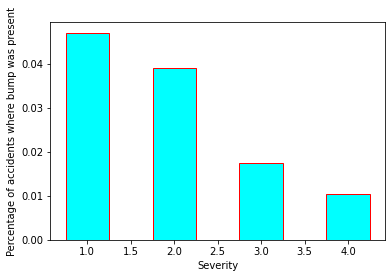

In [ ]:
plt.bar(Severity,severity_with_bump,width = 0.5
        ,edgecolor=['red'],linewidth=1,color=['cyan'])
plt.xlabel('Severity')
plt.ylabel('Percentage of accidents where bump was present')

We can see bump leads to more minor accident than severe one

### Junction

In [ ]:
# does Junction has any relationship with severity of accident?
severity_with_junction=[]
for i in range(4):
  severity_with_junction.append((len(df[(df['Severity'] == i+1) & (df['Junction'] == True)])/len(df[df['Severity'] == i+1]))*100)

severity_with_junction

[8.764097744360901, 9.577712750291427, 20.05197171024432, 11.598345846549163]

Text(0, 0.5, 'Percentage of accidents where junction was present')

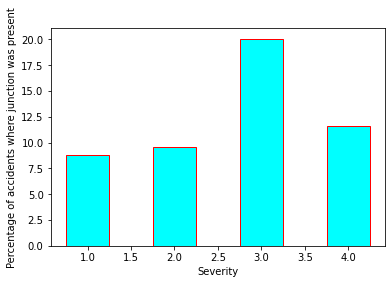

In [ ]:
plt.bar(Severity,severity_with_junction,width = 0.5
        ,edgecolor=['red'],linewidth=1,color=['cyan'])
plt.xlabel('Severity')
plt.ylabel('Percentage of accidents where junction was present')

We can see junction is the reason of more severe accidents

### Traffic Signal

In [ ]:
#  Is there any relationship any severity of accident with absent Traffic signal?
severity_with_traffic_signal=[]
for i in range(4):
  severity_with_traffic_signal.append((len(df[(df['Severity'] == i+1) & (df['Traffic_Signal'] == False)])/len(df[df['Severity'] == i+1]))*100)

severity_with_traffic_signal

[53.872963659147864, 91.16180761745578, 89.35316652378911, 89.6992813265347]

Text(0, 0.5, 'Percentage of accidents where traffic Signal was absent')

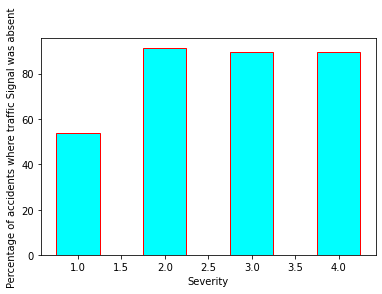

In [ ]:
plt.bar(Severity,severity_with_traffic_signal,width = 0.5
        ,edgecolor=['red'],linewidth=1,color=['cyan'])
plt.xlabel('Severity')
plt.ylabel('Percentage of accidents where traffic Signal was absent')

We can see traffic signal plays a huge role in avoiding accidents. More than 89% of high severity accidents can be prevented by installing traffic signals.

### Temperature

In [ ]:
import seaborn as sns

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


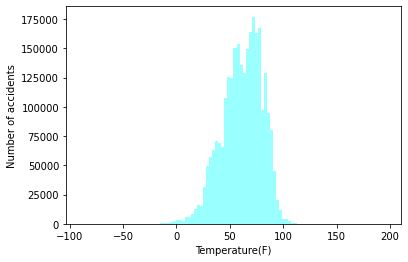

In [ ]:
ax=sns.distplot(df['Temperature(F)'], bins=100,kde=False,color='cyan')
ax.set(xlabel='Temperature(F)', ylabel='Number of accidents')
plt.show()

we cant draw much insight from this data because we dont know the variation of temperature with time over all those years in which this data was collected.

only when we divide the temperature by the time it persisted over the years, can we comment on relation of temperature with accidents.

### Visibility

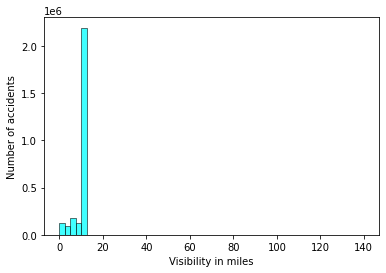

In [ ]:
ax=sns.histplot(df['Visibility(mi)'], bins=56,color='cyan')
ax.set(xlabel='Visibility in miles', ylabel='Number of accidents')
plt.show()

In [ ]:
# lets calculate the percentage of accidents below visibilty range 12.5.

(len(df[df['Visibility(mi)']<12.5])/len(df))*100


99.61379131072673

99.614% accidents happen below visibility of 12.5

- As we can see almost all the accidents occur at low visibility range below 12.5 miles.


- Also we can see that there are less accidents for visibility in the range 0 to 10, it doesnot mean that less visibility cause less accidents. because visibility is also time varying phenomenon.


- the more accurate question would have been , what percntage of accidents were severe for low visibility range?

In [ ]:
visibility=[0,2.5,5,7.5,10]
severe_accidents_with_visibility=[]
for i in range(0,125,25):
  severe_accidents_with_visibility.append((len(df[(df['Severity']>=3) & (df['Visibility(mi)']>=(i/10)) & (df['Visibility(mi)']<=((i+25)/10))])
  /len(df[(df['Visibility(mi)']>=(i/10)) & (df['Visibility(mi)']<=((i+25)/10))]))*100)
severe_accidents_with_visibility

[10.771711414429278,
 10.879119365149343,
 9.837895770999866,
 9.931970376930469,
 9.98745381928021]

Text(0, 0.5, 'Percentage of high severity accidents')

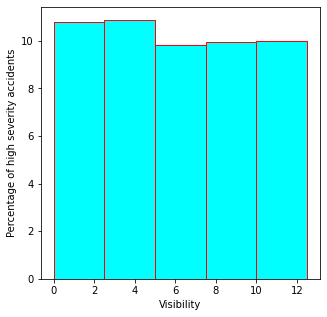

In [ ]:
plt.rcParams["figure.figsize"] = (5,5)
plt.bar(visibility,severe_accidents_with_visibility,width = 2.5
        ,edgecolor=['red'],linewidth=1,color=['cyan'],align='edge')
plt.xlabel('Visibility')
plt.ylabel('Percentage of high severity accidents')


- we can see that at low visibility the percentage of severe accidents was more
- also at low visibility people generally drive slow that will also affect the severity of accidents.


### State and City

In [ ]:
# lets find out cities with most number of accidents? since there are 10906 cities we will check only top 20

accidents_in_city = df['City'].value_counts()
accidents_in_city[0:20]

Miami           105044
Los Angeles      67912
Orlando          54168
Dallas           41648
Houston          38969
Charlotte        32760
Sacramento       32186
San Diego        26145
Raleigh          22616
Minneapolis      22449
Portland         20653
Nashville        20112
Baton Rouge      17922
Austin           17258
Phoenix          16868
Saint Paul       16438
New Orleans      15519
Atlanta          15343
Jacksonville     14705
Richmond         13745
Name: City, dtype: int64

city with highest number of accidents is miami.
Why is new york not in list of top 20 even though it is most populus city?

In [ ]:
# lets find out new york's curious case

'New York' in df['City']

False

now we know that new york's accidents are not present in this data.

In [ ]:
# lets find out states with most number of accidents

accidents_in_State = df['State'].value_counts()
accidents_in_State

CA    763832
FL    391632
TX    145290
OR    121588
VA    104636
NY    103276
PA     94363
MN     92825
NC     88448
SC     86387
AZ     53713
MD     52347
TN     51862
NJ     50026
IL     46614
LA     46020
MI     43270
UT     43219
GA     38458
WA     31499
CT     29116
MO     28746
CO     24353
OH     23972
IN     20166
AL     18641
MT     14813
AR     10407
IA      9110
OK      8646
DC      8626
ID      7907
WI      7798
KS      7420
WV      7394
KY      6472
MA      6077
NV      5975
MS      5161
DE      4745
RI      4229
NH      3801
NE      3155
NM      2302
ME      2142
ND      1712
WY       944
VT       345
SD       177
Name: State, dtype: int64

We know that california has most number of accidents and south dakota has least 

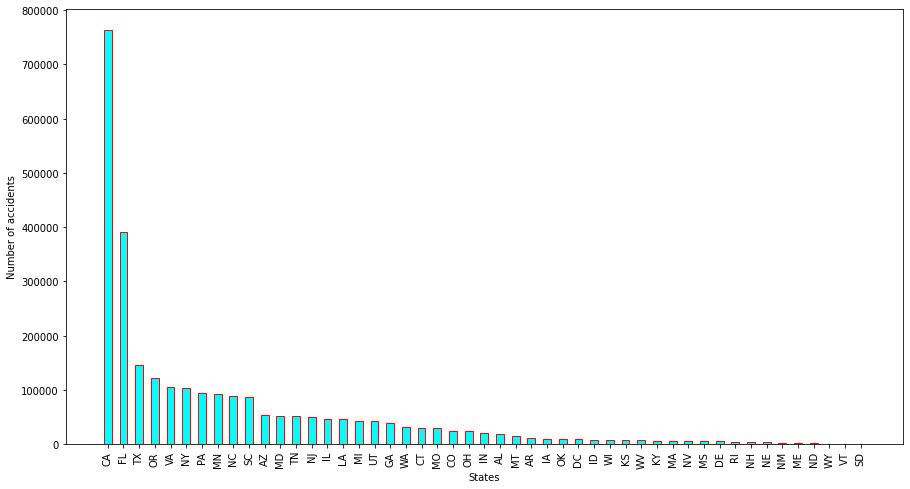

In [ ]:
# plotting number of accidents per state
plt.rcParams["figure.figsize"] = (15,8)
plt.bar(accidents_in_State.index,accidents_in_State.iloc[:],width = 0.5
        ,edgecolor=['red'],linewidth=1,color=['cyan'])
plt.xlabel('States')
plt.ylabel('Number of accidents')
plt.xticks(rotation=90)
plt.show()

In [ ]:
import squarify

Text(0.5, 1.0, 'Number of Accidents per state')

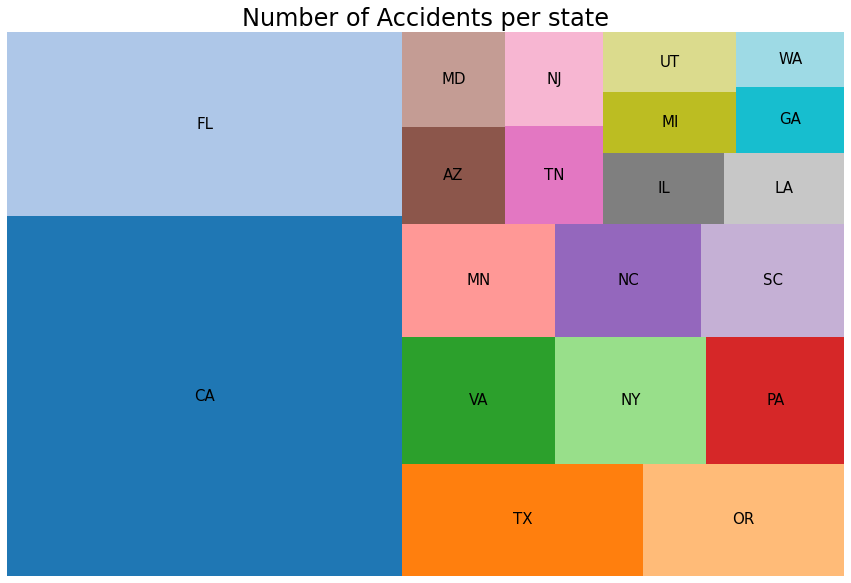

In [ ]:
plt.rcParams["figure.figsize"] = (15,10)
axis=squarify.plot(accidents_in_State.iloc[:20], label=accidents_in_State.index[:20],
                   color=sns.color_palette("tab20",49),text_kwargs={'fontsize': 15})
  
plt.axis("off")

axis.set_title("Number of Accidents per state", fontsize=24)

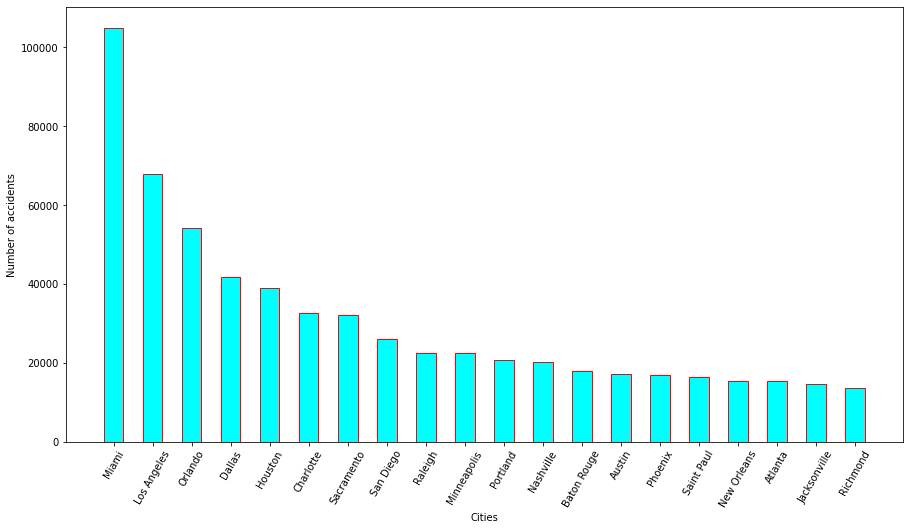

In [ ]:
# plotting number of accidents per state
plt.rcParams["figure.figsize"] = (15,8)
plt.bar(accidents_in_city.index[0:20],accidents_in_city.iloc[:20],width = 0.5
        ,edgecolor=['red'],linewidth=1,color=['cyan'])
plt.xlabel('Cities')
plt.ylabel('Number of accidents')
plt.xticks(rotation=60)
plt.show()

Text(0.5, 1.0, 'Number of Accidents per City')

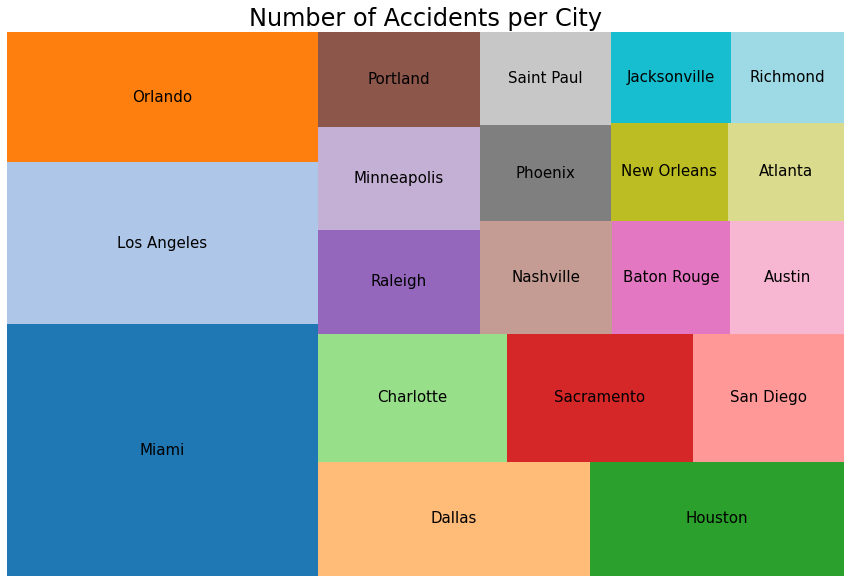

In [ ]:
plt.rcParams["figure.figsize"] = (15,10)
axis_1=squarify.plot(accidents_in_city.iloc[:20], label=accidents_in_city.index[:20],
                   color=sns.color_palette("tab20",49),text_kwargs={'fontsize': 15})
  
plt.axis("off")

axis_1.set_title("Number of Accidents per City", fontsize=24)

### Weather Conditions

In [ ]:
# lets find out the most dangerous weather condition for driving

accidents_with_weather = df['Weather_Condition'].value_counts()
accidents_with_weather[0:20]


Fair                       1084920
Mostly Cloudy               358468
Cloudy                      341090
Partly Cloudy               245951
Clear                       171563
Light Rain                  126352
Overcast                     83795
Scattered Clouds             44617
Light Snow                   42705
Fog                          40378
Haze                         35745
Rain                         30480
Fair / Windy                 14796
Heavy Rain                   11590
Smoke                         7074
Light Drizzle                 6892
Thunder in the Vicinity       6812
Cloudy / Windy                6581
T-Storm                       6465
Mostly Cloudy / Windy         6149
Name: Weather_Condition, dtype: int64

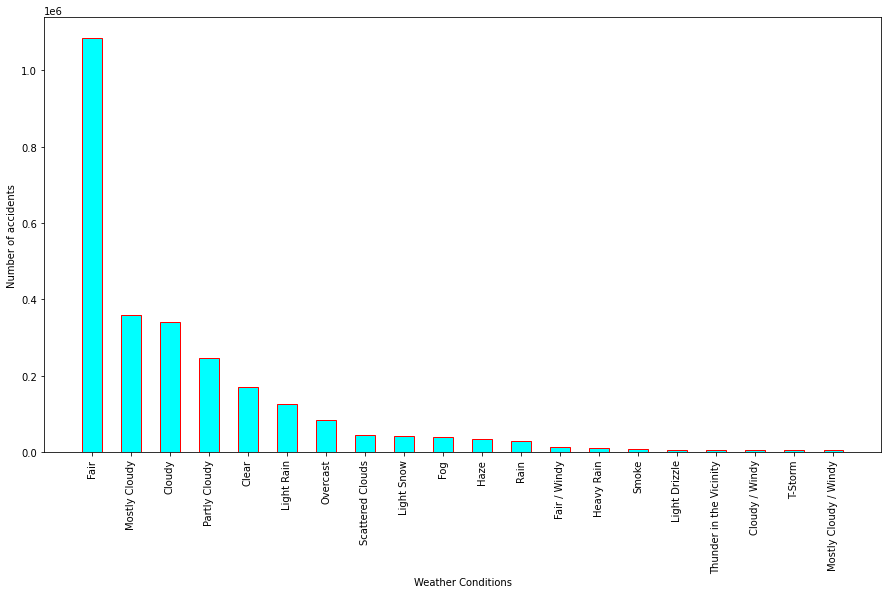

In [ ]:
# plotting number of accidents in different weather conditions
plt.rcParams["figure.figsize"] = (15,8)
plt.bar(accidents_with_weather.index[0:20],accidents_with_weather.iloc[0:20],width = 0.5
        ,edgecolor=['red'],linewidth=1,color=['cyan'])
plt.xlabel('Weather Conditions')
plt.ylabel('Number of accidents')
plt.xticks(rotation=90)
plt.show()

the data shows that we had more number of accidents in fair weather condition, but we cannot say that fair weather condition is most dangerous weather condition because we dont have information about the time over which these wether condition persisted.

there might we chances that foggy wether condition only persist over 0.5% time of the year but contribute to 10 percent of all accidents 

hence we need more data about the weather conditon and time over which it persisted throughtout the year.

In [ ]:
(len(df[(df['Severity']>=3) & (df['Weather_Condition']=='Fair')])/len(df[df['Weather_Condition']=='Fair']))*100

4.626239722744534

In [ ]:
# we can ask that at which weather condition there are more severe accidents?
weather=[]
severe_accidents_with_weather=[]
for item in df.Weather_Condition.unique():
  weather.append(item)
  severe_accidents_with_weather.append((len(df[(df['Severity']>=3) & (df['Weather_Condition']==item)])/len(df[df['Weather_Condition']==item]))*100)
severe_accidents_with_weather[:20]

[11.402273015069014,
 34.540247031445794,
 11.030273274043987,
 13.411078717201166,
 13.073410607657182,
 6.4156087836055,
 31.911603200573772,
 31.793568543333933,
 10.456960939374103,
 25.068870523415974,
 15.27858386535113,
 5.944887396838719,
 10.242782152230971,
 9.861949956859362,
 4.626239722744534,
 16.89884918231375,
 6.020605280103027,
 32.93172690763052,
 7.046332046332046,
 37.765466297322256]

In [ ]:
combined_list=list(zip(weather,severe_accidents_with_weather))
sorted_list = sorted(combined_list, key=lambda x: x[1], reverse=True)
sorted_weather = [x[0] for x in sorted_list]
sorted_severe_accidents_with_weather = [x[1] for x in sorted_list]

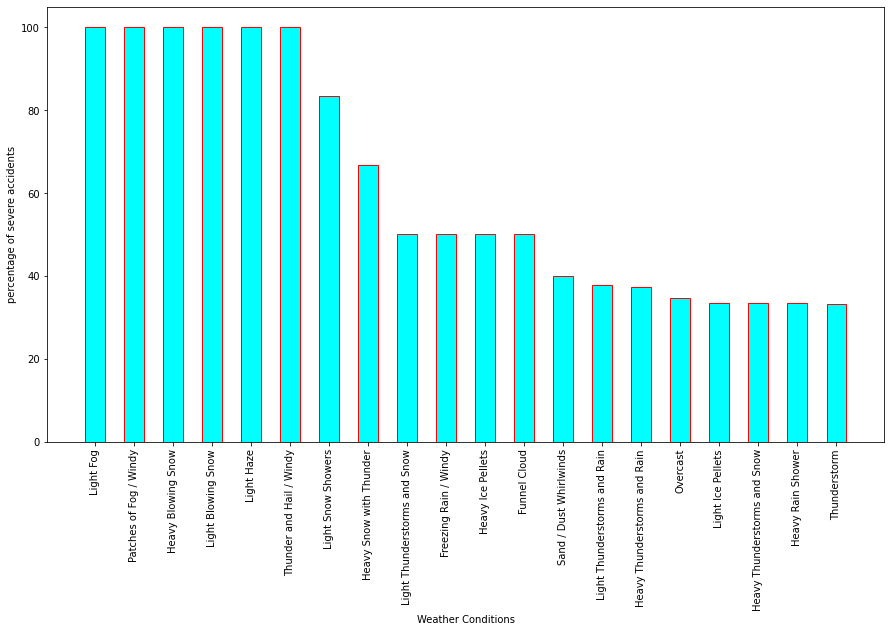

In [ ]:
# plotting number of accidents in different weather conditions
plt.rcParams["figure.figsize"] = (15,8)
plt.bar(sorted_weather[0:20],sorted_severe_accidents_with_weather[0:20],width = 0.5
        ,edgecolor=['red'],linewidth=1,color=['cyan'])
plt.xlabel('Weather Conditions')
plt.ylabel('percentage of severe accidents')
plt.xticks(rotation=90)
plt.show()

In [ ]:
(len(df[(df['Severity']>=3) & (df['Weather_Condition']=='Light Fog')])/len(df[df['Weather_Condition']=='Light Fog']))*100

100.0

In [ ]:
count_of_rare_weather_conditions=[len(df[df['Weather_Condition']=='Light Fog']),len(df[df['Weather_Condition']=='Patches of Fog / Windy']),len(df[df['Weather_Condition']=='Heavy Blowing Snow']),
len(df[df['Weather_Condition']=='Light Haze']),len(df[df['Weather_Condition']=='Thunder and Hail / Windy'])]
count_of_rare_weather_conditions

[1, 4, 1, 1, 1]

Some weather conditions shows that 100 percent of accidents are of high severity , but these are some very rare weather conditions, hence we have to choose some common weather conditions only to draw any insight

In [ ]:
# lets check some weathers whose frequency is atleast greater than 500
counts = df['Weather_Condition'].value_counts()
more_frequent_weathers=counts[counts > 500].index.tolist()
len(more_frequent_weathers)

42

there are only 42 weather conditions which have frequency greater than 500

In [ ]:
# now lets do the same process for for only these weather conditions
weather=[]
severe_accidents_with_weather=[]
for item in more_frequent_weathers:
  weather.append(item)
  severe_accidents_with_weather.append((len(df[(df['Severity']>=3) & (df['Weather_Condition']==item)])/len(df[df['Weather_Condition']==item]))*100)
severe_accidents_with_weather

[4.626239722744534,
 11.030273274043987,
 6.4156087836055,
 10.456960939374103,
 31.793568543333933,
 11.402273015069014,
 34.540247031445794,
 31.911603200573772,
 13.073410607657182,
 6.020605280103027,
 5.944887396838719,
 10.242782152230971,
 6.265206812652069,
 9.861949956859362,
 5.286966355668646,
 15.27858386535113,
 5.328831473869642,
 7.931925239325331,
 7.795823665893272,
 9.708895755407383,
 5.059021922428331,
 8.12464155993118,
 13.411078717201166,
 9.397398460313248,
 5.758464409490802,
 6.492411467116358,
 9.233082706766917,
 5.5208833413346134,
 16.89884918231375,
 15.560314061384725,
 37.765466297322256,
 6.454630495790459,
 7.046332046332046,
 5.069582504970179,
 16.34517766497462,
 33.12564901349948,
 7.569296375266525,
 30.04484304932735,
 4.58970792767733,
 12.244897959183673,
 5.100182149362477,
 37.227722772277225]

In [ ]:
combined_list=list(zip(weather,severe_accidents_with_weather))
sorted_list = sorted(combined_list, key=lambda x: x[1], reverse=True)
sorted_weather = [x[0] for x in sorted_list]
sorted_severe_accidents_with_weather = [x[1] for x in sorted_list]

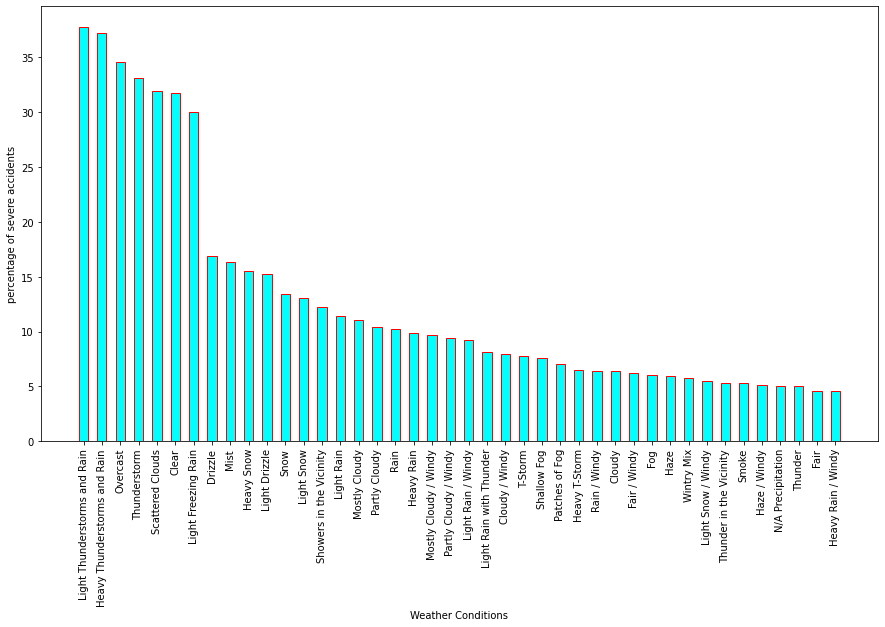

In [ ]:
# plotting number of accidents in different weather conditions
plt.rcParams["figure.figsize"] = (15,8)
plt.bar(sorted_weather[:],sorted_severe_accidents_with_weather[:],width = 0.5
        ,edgecolor=['red'],linewidth=1,color=['cyan'])
plt.xlabel('Weather Conditions')
plt.ylabel('percentage of severe accidents')
plt.xticks(rotation=90)
plt.show()

- We can observe that three out of the top four weather conditions that have a high probability of causing severe accidents contain the word "thunderstorm".
- we can say that one should be more careful while driving during thunderstorm


### Start_time

In [ ]:
# are accidents decreasing/increasing every year?

year=df.Start_Time.dt.year.unique()
number_of_accidents_per_year=[]
for item in year:
  number_of_accidents_per_year.append(len(df[df.Start_Time.dt.year==item]))
number_of_accidents_per_year

[117925, 157221, 1454231, 588976, 156391, 248913]

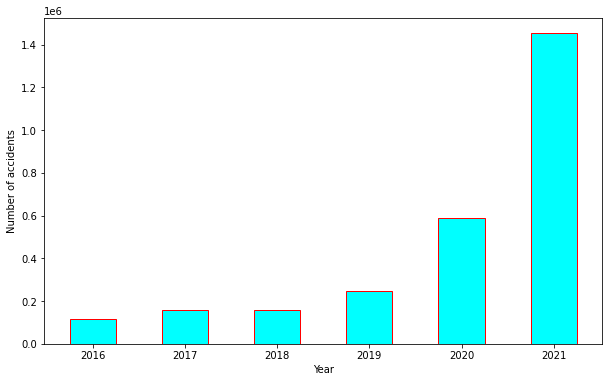

In [ ]:
plt.rcParams["figure.figsize"] = (10,6)
plt.bar(year,number_of_accidents_per_year,width = 0.5
        ,edgecolor=['red'],linewidth=1,color=['cyan'])
plt.xlabel('Year')
plt.ylabel('Number of accidents')
plt.show()

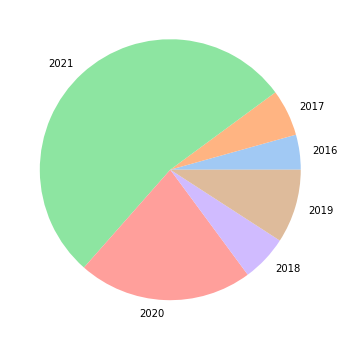

In [ ]:
palette_color = sns.color_palette('pastel')
plt.pie(number_of_accidents_per_year, labels=year, colors=palette_color)
plt.show()

- We found out that number of accidents are increasing every year almost exponentially
- what could be the reason?
- maybe there is some missing data in source itself
- not every accident is recorded for initial years.
- 2020 and 2021 lockdown years still more accident?


In [ ]:
# in which month the accidents are maximum?
month=df.Start_Time.dt.month.unique()
number_of_accidents_per_month=[]
for item in month:
  number_of_accidents_per_month.append(len(df[df.Start_Time.dt.month==item]))
number_of_accidents_per_month

[186831,
 151919,
 165475,
 175062,
 216636,
 342409,
 453228,
 188835,
 287499,
 231881,
 171537,
 152345]

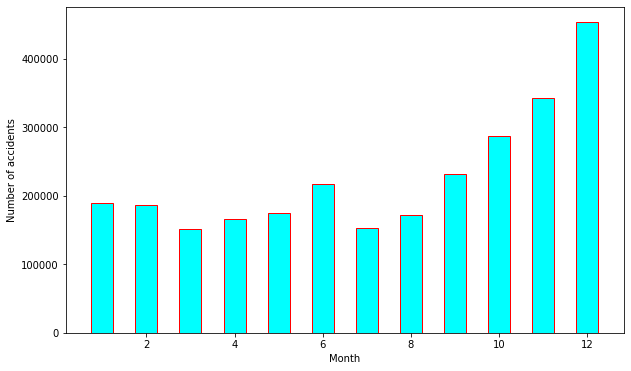

In [ ]:
plt.rcParams["figure.figsize"] = (10,6)
plt.bar(month,number_of_accidents_per_month,width = 0.5
        ,edgecolor=['red'],linewidth=1,color=['cyan'])
plt.xlabel('Month')
plt.ylabel('Number of accidents')
plt.show()

- why are there more accidents during months 9 to 12?
- is this trend same for every year?

In [ ]:
number_of_accidents_per_month_in_2016=[]
for item in month:
  number_of_accidents_per_month_in_2016.append(len(df[(df.Start_Time.dt.month==item) & (df.Start_Time.dt.year==2016)]))
number_of_accidents_per_month_in_2016

[536, 2327, 5790, 6885, 9280, 16785, 17142, 7, 15716, 13805, 16163, 13489]

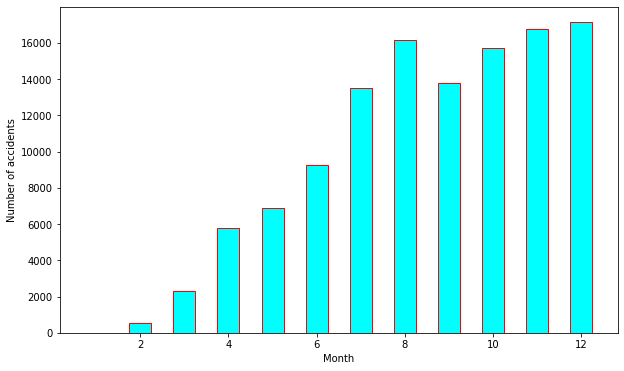

In [ ]:
plt.rcParams["figure.figsize"] = (10,6)
plt.bar(month,number_of_accidents_per_month_in_2016,width = 0.5
        ,edgecolor=['red'],linewidth=1,color=['cyan'])
plt.xlabel('Month')
plt.ylabel('Number of accidents')
plt.show()

- We can see there is defenitely missing data in the source itself
- because there cant be just 7 accidents in whole usa in jan 2016

In [ ]:
number_of_accidents_per_month_in_2017=[]
for item in month:
  number_of_accidents_per_month_in_2017.append(len(df[(df.Start_Time.dt.month==item) & (df.Start_Time.dt.year==2017)]))
number_of_accidents_per_month_in_2017

[14691,
 16001,
 13052,
 14729,
 13333,
 11262,
 12093,
 15234,
 11126,
 10542,
 12619,
 12539]

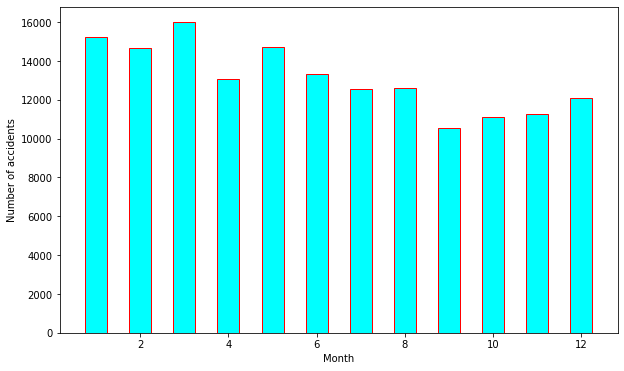

In [ ]:
plt.rcParams["figure.figsize"] = (10,6)
plt.bar(month,number_of_accidents_per_month_in_2017,width = 0.5
        ,edgecolor=['red'],linewidth=1,color=['cyan'])
plt.xlabel('Month')
plt.ylabel('Number of accidents')
plt.show()

In [ ]:
number_of_accidents_per_month_in_2018=[]
for item in month:
  number_of_accidents_per_month_in_2018.append(len(df[(df.Start_Time.dt.month==item) & (df.Start_Time.dt.year==2018)]))
number_of_accidents_per_month_in_2018

[12116,
 11830,
 10532,
 10494,
 9459,
 16918,
 18936,
 13910,
 16077,
 13868,
 11907,
 10344]

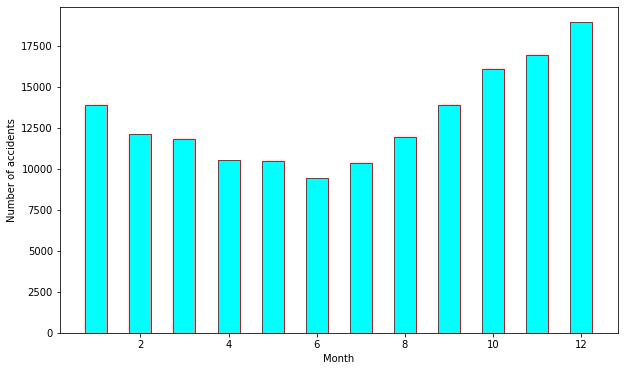

In [ ]:
plt.rcParams["figure.figsize"] = (10,6)
plt.bar(month,number_of_accidents_per_month_in_2018,width = 0.5
        ,edgecolor=['red'],linewidth=1,color=['cyan'])
plt.xlabel('Month')
plt.ylabel('Number of accidents')
plt.show()

In [ ]:
number_of_accidents_per_month_in_2019=[]
for item in month:
  number_of_accidents_per_month_in_2019.append(len(df[(df.Start_Time.dt.month==item) & (df.Start_Time.dt.year==2019)]))
number_of_accidents_per_month_in_2019

[16951,
 13935,
 14368,
 14411,
 12588,
 19080,
 38815,
 16559,
 39062,
 32296,
 17587,
 13261]

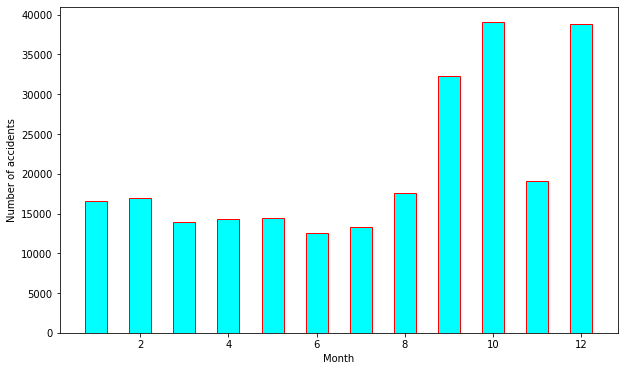

In [ ]:
plt.rcParams["figure.figsize"] = (10,6)
plt.bar(month,number_of_accidents_per_month_in_2019,width = 0.5
        ,edgecolor=['red'],linewidth=1,color=['cyan'])
plt.xlabel('Month')
plt.ylabel('Number of accidents')
plt.show()

In [ ]:
number_of_accidents_per_month_in_2020=[]
for item in month:
  number_of_accidents_per_month_in_2020.append(len(df[(df.Start_Time.dt.month==item) & (df.Start_Time.dt.year==2020)]))
number_of_accidents_per_month_in_2020

[33099,
 44546,
 53432,
 53019,
 59516,
 99409,
 109189,
 37001,
 65346,
 33796,
 454,
 169]

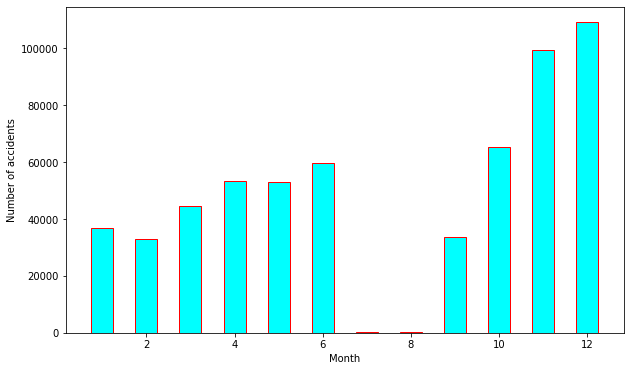

In [ ]:
plt.rcParams["figure.figsize"] = (10,6)
plt.bar(month,number_of_accidents_per_month_in_2020,width = 0.5
        ,edgecolor=['red'],linewidth=1,color=['cyan'])
plt.xlabel('Month')
plt.ylabel('Number of accidents')
plt.show()

In [ ]:
number_of_accidents_per_month_in_2021=[]
for item in month:
  number_of_accidents_per_month_in_2021.append(len(df[(df.Start_Time.dt.month==item) & (df.Start_Time.dt.year==2021)]))
number_of_accidents_per_month_in_2021

[109438,
 63280,
 68301,
 75524,
 112460,
 178955,
 257053,
 106124,
 140172,
 127574,
 112807,
 102543]

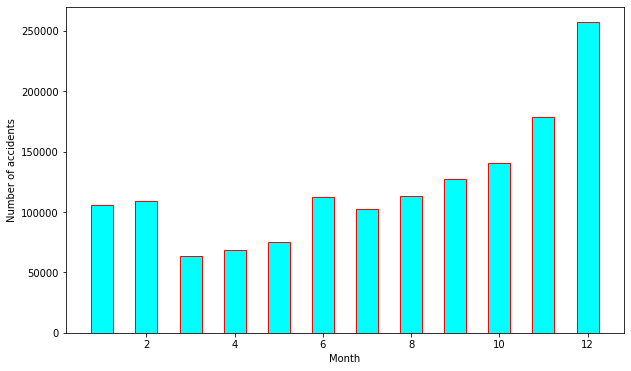

In [ ]:
plt.rcParams["figure.figsize"] = (10,6)
plt.bar(month,number_of_accidents_per_month_in_2021,width = 0.5
        ,edgecolor=['red'],linewidth=1,color=['cyan'])
plt.xlabel('Month')
plt.ylabel('Number of accidents')
plt.show()

- clearly this is not the complete data because it shows that there are almost 

---

no accidents in the month of july and august of 2020, which is very suspecious.

In [ ]:
# now lets check if there is any relationship between accidents and hour of the day
hour=df.Start_Time.dt.hour.unique()
number_of_accidents_per_hour=[]
for item in hour:
  number_of_accidents_per_hour.append(len(df[df.Start_Time.dt.hour==item]))
number_of_accidents_per_hour

[64729,
 76781,
 106620,
 129995,
 125745,
 108652,
 184193,
 206139,
 210520,
 212419,
 162216,
 111715,
 89994,
 82452,
 104467,
 99432,
 138142,
 76656,
 159839,
 70111,
 49158,
 45876,
 52057,
 55749]

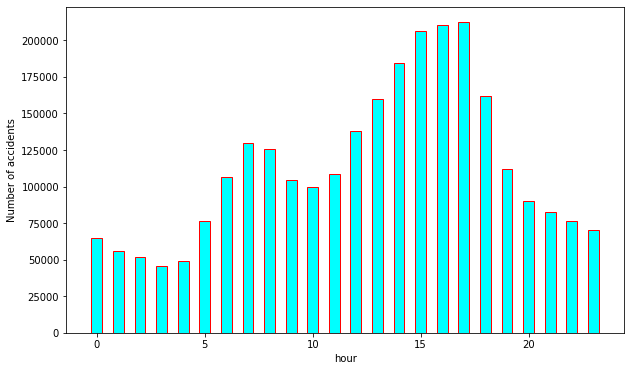

In [ ]:
plt.rcParams["figure.figsize"] = (10,6)
plt.bar(hour,number_of_accidents_per_hour,width = 0.5
        ,edgecolor=['red'],linewidth=1,color=['cyan'])
plt.xlabel('hour')
plt.ylabel('Number of accidents')
plt.show()

- we see there are two peaks in accidents, 
- first between 6 am to 10 am and other between 3 pm to 6pm 
- these are peak hours, people are in hurry to get to work and return home.

In [ ]:
# accidents distribution per hour on weekdays
hour=df.Start_Time.dt.hour.unique()
number_of_accidents_per_hour_on_weekdays=[]
for item in hour:
  number_of_accidents_per_hour_on_weekdays.append(len(df[(df.Start_Time.dt.hour==item) & (df.Start_Time.dt.dayofweek<5)]))
number_of_accidents_per_hour_on_weekdays

[43736,
 62837,
 91631,
 114648,
 110017,
 83675,
 151575,
 174439,
 180011,
 181743,
 132993,
 85816,
 66141,
 59234,
 86588,
 77533,
 109349,
 55294,
 128805,
 50734,
 35718,
 30578,
 32950,
 36863]

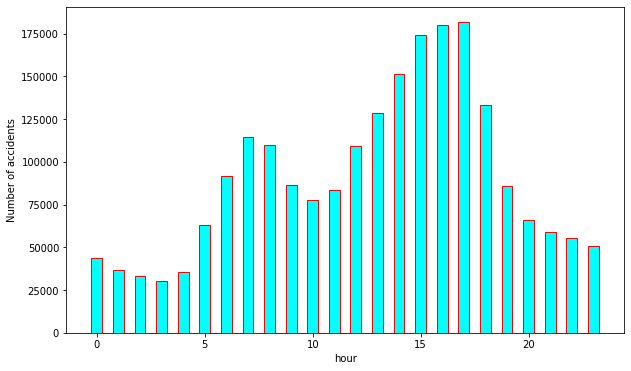

In [ ]:
plt.rcParams["figure.figsize"] = (10,6)
plt.bar(hour,number_of_accidents_per_hour_on_weekdays,width = 0.5
        ,edgecolor=['red'],linewidth=1,color=['cyan'])
plt.xlabel('hour')
plt.ylabel('Number of accidents')
plt.show()

trend is same for weekdays

In [ ]:
# accidents distribution per hour on weekends
hour=df.Start_Time.dt.hour.unique()
number_of_accidents_per_hour_on_weekends=[]
for item in hour:
  number_of_accidents_per_hour_on_weekends.append(len(df[(df.Start_Time.dt.hour==item) & (df.Start_Time.dt.dayofweek>4)]))
number_of_accidents_per_hour_on_weekends

[20993,
 13944,
 14989,
 15347,
 15728,
 24977,
 32618,
 31700,
 30509,
 30676,
 29223,
 25899,
 23853,
 23218,
 17879,
 21899,
 28793,
 21362,
 31034,
 19377,
 13440,
 15298,
 19107,
 18886]

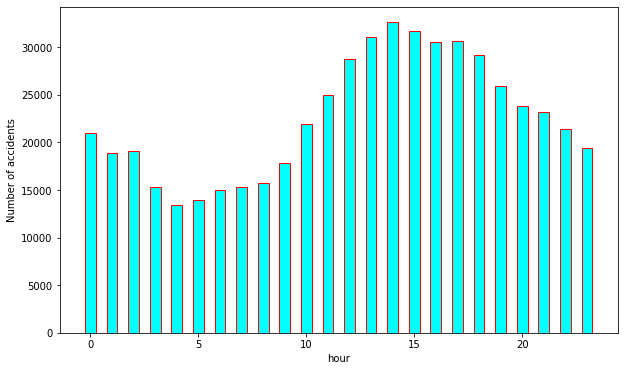

In [ ]:
plt.rcParams["figure.figsize"] = (10,6)
plt.bar(hour,number_of_accidents_per_hour_on_weekends,width = 0.5
        ,edgecolor=['red'],linewidth=1,color=['cyan'])
plt.xlabel('hour')
plt.ylabel('Number of accidents')
plt.show()

- we can clearly see that distribution is different for weekends.
- on weekends its during the afternoon that most accidents occur:

### Latitude and Longitude

<AxesSubplot:xlabel='Start_Lng', ylabel='Start_Lat'>

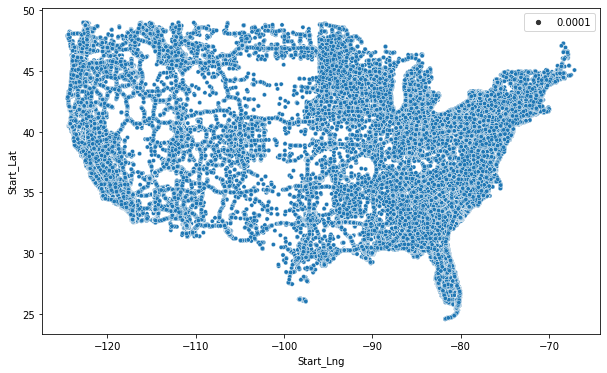

In [ ]:
# lets just plot a scatter plot of all the given lat and long co ordinates and check if we get something meaningful?

sns.scatterplot(x=df.Start_Lng,y=df.Start_Lat,size=0.0001)

- wow,we can see a rough map of usa
- we can see that number of accidents is more near costal lines this is because of high population density

In [ ]:
import folium
from folium import plugins
from folium.plugins import HeatMap

In [ ]:
# lets make a sample dataframe because of ram limitation we cannot load full data on map
sample_df = df.sample(int(len(df)/1000))

In [ ]:
map= folium.Map()
for i in range(0,len(sample_df)):
  marker=folium.Marker((sample_df.Start_Lat.iloc[i],sample_df.Start_Lng.iloc[i]))
  marker.add_to(map)

map

- we got the location of some of the points were accident happened, it will be very messy to plot all the points , insted we can plot a heat map of the accident on the map

In [ ]:
#lets plot a heat map
new_df = df.sample(500000) 
lat_lng_pairs=list(zip(list(new_df.Start_Lat),list(new_df.Start_Lng)))
map=folium.Map()
HeatMap(lat_lng_pairs[:]).add_to(map)
map


## Summary

- most of the accidents are of severity 2, around 89% 
- there are very few severity 1 accidents. maybe because most of the goes unreported
- In 98.25% cases Amenity was not present nearby the site of accident
- Driving on wrong side of the road contribute about 17% of all accidents
- Absence of Traffic Signal accounts to appox 90% of all accidents
- At low visibility the chances of high severity accidents are higher
- Data for new york city is missing
- Top 5 states with most number of accidents are:
  * California
  * Florida
  * Texas 
  * Oregon
  * Virginia
- Top 5 cities with most number of accidents are : 
  * Miami
  * Los Angeles
  * Orlando
  * Dallas
  * Houston
- One should be more cautious while driving during thunderstorms because there is high probability of sever accidents
- Accidents are increasing every year exponentially, which is suspecious.
- There is some missing data in source itself, When we analysed monthwise data ,it was observed few months have unexpectedly low accident reports
- During peak hours on weekdays the probability of accident increases.
- On weekends, the probability of accidents is highest during afternoon.
- There are more accidents along costal lines because of high population density.

